In [1]:
from sodapy import Socrata
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import folium
from IPython.display import Image

client = Socrata("data.cambridgema.gov", None)
results = client.get("ybgw-x84i", limit=40000)

# Convert to pandas DataFrame
df = pd.DataFrame.from_records(results)

In [2]:
df.head()

,address_id,building_id,cad_reporting_district,census_block_2010,census_block_group_2010,census_block_id_2010,census_tract_2010,election_polling_address,election_precinct,election_ward,...,police_neighborhood,police_sector,police_walking_route,representation_district,senate_district,stname,street_number,street_sweeping_district,type,zip_code
0,50,70-32,1202,4014,4,250173546004014,354600,450 Concord Ave,2,9,...,12,4,12C,29th Middlesex,Second Middlesex,Blanchard Rd,25,J,BUILDING,02138
1,15340,348-9,1017,2008,2,250173541002008,354100,5 Longfellow Park,2,8,...,10,4,NaN,25th Middlesex,Middlesex and Suffolk,Memorial Dr,993,K,BUILDING,02138
2,3469,588-18,405,2009,2,250173525002009,352500,131 Washington St,1,2,...,4,2,4B,26th Middlesex,Middlesex and Suffolk,Windsor St,177,B,BUILDING,02139
3,26451,620-11,103,2014,2,250173523002014,352300,70 Massachusetts Ave,3,2,...,1,1,1C,8th Suffolk,First Suffolk and Middlesex,West Kendall St,605,None,BUILDING,02142
4,2735,715-41,509,3003,3,250173533003003,353300,Magazine St,2,5,...,5,3,5B,8th Suffolk,First Suffolk and Middlesex,Magazine St,153,C,BUILDING,02139


In [3]:
# Only keeping observations where 'type' == 'BUILDING'
df = df[df['type'] == 'BUILDING']

# Part 1: Looking at Street Names and Numbers

<big> We'll start by looking at street names and picking out which are the most vulnerable, i.e. have only a very small number of addresses assigned to them.

There are <b>764</b> unique street names in the city.

In [4]:
df['stname'].nunique()

764

### Count of addresses assigned to each street
<big> A rough look at which street names are the most and least popular are shown below. Not surprisingly, streets like Mass Ave and Broadway have the most addresses assigned to them.

In [47]:
street_count = df.groupby('stname').nunique().sort_values('address_id')['address_id']
pd.DataFrame(street_count)

,address_id
stname,
Munroe St,1
Cadbury Rd,1
North Point Blvd,1
Industrial Park Rd,1
Linskey Way,1
Gold Star Road Pl,1
Revere St,1
Roosevelt Towers,1
WInslow St,1


### Distribution of addresses assigned to streets
<big> The median number of addresses given to a given street is about <b>12 addresses</b>, which seems fairly small. The mean of about 27 seems highly influenced by extreme values, given that only 35 out of 770 unique streets have more than 100 addresses assigned to them. We could therefore look at a few examples of streets with 12 addresses to see what the typical Cambridge street may look like and how it may or may not be vulnerable to privacy risks, even after anonymization.

In [6]:
street_count.describe()

count    764.000000
mean      26.412304
std       45.105136
min        1.000000
25%        5.000000
50%       12.000000
75%       30.000000
max      717.000000
Name: address_id, dtype: float64

Text(0.5,1,'Distribution of Addresses Assigned to Each Street')

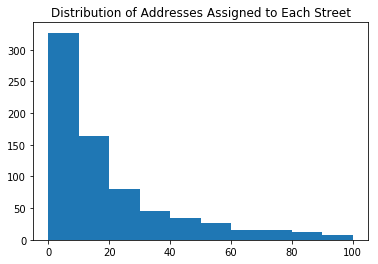

In [7]:
plt.hist(street_count, bins=[0, 10, 20, 30, 40, 50, 60, 70, 80, 90, 100])
plt.title('Distribution of Addresses Assigned to Each Street')

In [8]:
street_count[street_count == 12]

stname
Brattle Cir       12
Divinity Ave      12
Columbus Ave      12
Sacramento Pl     12
Gerry St          12
Davenport St      12
Seckel St         12
Shady Hill Sq     12
Camp St           12
Lopez Ave         12
Plympton St       12
Van Norden St     12
Blake St          12
Walnut Ave        12
Irving Ter        12
Pleasant Pl       12
Verdun St         12
Vincent St        12
Traill St         12
Notre Dame Ave    12
Name: address_id, dtype: int64

### A case with 12 addresses: Plympton Street

In [9]:
df[df['stname'] == 'Plympton St']

,address_id,building_id,cad_reporting_district,census_block_2010,census_block_group_2010,census_block_id_2010,census_tract_2010,election_polling_address,election_precinct,election_ward,...,police_neighborhood,police_sector,police_walking_route,representation_district,senate_district,stname,street_number,street_sweeping_district,type,zip_code
3979,4144,401-2,708,4001,4,250173537004001,353700,48 Quincy St,3,7,...,7,4,H15,25th Middlesex,Middlesex and Suffolk,Plympton St,6,E,BUILDING,02138
5336,4146,401-6,708,4001,4,250173537004001,353700,48 Quincy St,3,7,...,7,4,H15,25th Middlesex,Middlesex and Suffolk,Plympton St,22,E,BUILDING,02138
8797,31532,401-1,708,4001,4,250173537004001,353700,48 Quincy St,3,7,...,7,4,H15,25th Middlesex,Middlesex and Suffolk,Plympton St,12,E,BUILDING,02138
9657,26181,438-3,708,3000,3,250173539003000,353900,58 Plympton St,3,8,...,7,4,H15,25th Middlesex,Middlesex and Suffolk,Plympton St,30,E,BUILDING,02138
11709,15641,395-1,708,4002,4,250173537004002,353700,48 Quincy St,3,7,...,7,4,H15,25th Middlesex,Middlesex and Suffolk,Plympton St,1,E,BUILDING,02138
12994,4145,401-1,708,4001,4,250173537004001,353700,48 Quincy St,3,7,...,7,4,H15,25th Middlesex,Middlesex and Suffolk,Plympton St,14,E,BUILDING,02138
15168,23767,438-1,707,3011,3,250173539003011,353900,58 Plympton St,3,8,...,7,4,,25th Middlesex,Middlesex and Suffolk,Plympton St,58,E,BUILDING,02138
15466,17718,401-2,708,4001,4,250173537004001,353700,48 Quincy St,3,7,...,7,4,H15,25th Middlesex,Middlesex and Suffolk,Plympton St,8,E,BUILDING,02138
16239,370,401-11,708,4001,4,250173537004001,353700,48 Quincy St,3,7,...,7,4,H15,25th Middlesex,Middlesex and Suffolk,Plympton St,26,E,BUILDING,02138
17535,32465,437-10,707,3008,3,250173539003008,353900,58 Plympton St,3,8,...,7,4,,25th Middlesex,Middlesex and Suffolk,Plympton St,111,E,BUILDING,02138


In [10]:
folium.Map(location=[42.371364, -71.117082], zoom_start=17)

<big> Plympton Street is shown as a short street, but with arguably enough addresses where anonymization is not a particularly pressing concern. By contrast, it would be helpful to see where high priorities for anonymization may be placed by looking at a few addresses with only one or two addresses.

## Cases with 1 or 2 addresses: Dudley Court and Washburn Terrace

In [11]:
street_count[street_count<3]

stname
Munroe St             1
Cadbury Rd            1
North Point Blvd      1
Industrial Park Rd    1
Linskey Way           1
Gold Star Road Pl     1
Revere St             1
Roosevelt Towers      1
WInslow St            1
Harvard Sq            1
Cross St              1
Education Cir         1
Cambridgeside Pl      1
Lawn Ct               1
Porter Sq             1
Jay Street Pl         1
Hastings Ave          1
Frisbie Pl            1
State St              1
Potter St             1
Charles Pk            1
Water St              1
Follen Ln             1
Doane St              1
Aberdeen Way          1
Flanders Rd           1
Dudley Ct             1
Cherry Ct             1
Science Pk            1
Willard Street Ct     1
                     ..
Brookline Pl          2
Belmont Ct            2
Drummond Pl           2
Wyman St              2
Wilson Ave            2
Earhart St            2
Houston Pk            2
Hovey Ave             2
Washington Ct         2
Washburn Ter          2
Appleton 

### Dudley Court

In [12]:
df[df['stname'] == 'Dudley Ct']

,address_id,building_id,cad_reporting_district,census_block_2010,census_block_group_2010,census_block_id_2010,census_tract_2010,election_polling_address,election_precinct,election_ward,...,police_neighborhood,police_sector,police_walking_route,representation_district,senate_district,stname,street_number,street_sweeping_district,type,zip_code
3635,6189,50-14,1108,3023,3,250173549003023,354900,70-R Rindge Ave,2,11,...,11,5,11C,29th Middlesex,Second Middlesex,Dudley Ct,1,G,BUILDING,02140


In [13]:
df.loc[(3635)]

address_id                              6189
building_id                            50-14
cad_reporting_district                  1108
census_block_2010                       3023
census_block_group_2010                    3
census_block_id_2010         250173549003023
census_tract_2010                     354900
election_polling_address     70-R Rindge Ave
election_precinct                          2
election_ward                             11
full_addr                        1 Dudley Ct
latitude                             42.3954
longitude                           -71.1335
maplot                                193-73
neighborhood                 North Cambridge
police_business_district                   9
police_car_route                         11R
police_neighborhood                       11
police_sector                              5
police_walking_route                     11C
representation_district       29th Middlesex
senate_district             Second Middlesex
stname    

In [14]:
folium.Map(location=[42.3954, -71.1335], zoom_start=20)

<big> As you can see, there is only one address on Dudley Court, which is a very short street that extends out from Dudley Street.

### Washburn Terrace

In [15]:
df[df['stname'] == 'Washburn Ter']

,address_id,building_id,cad_reporting_district,census_block_2010,census_block_group_2010,census_block_id_2010,census_tract_2010,election_polling_address,election_precinct,election_ward,...,police_neighborhood,police_sector,police_walking_route,representation_district,senate_district,stname,street_number,street_sweeping_district,type,zip_code
1674,30802,15-6,1103,2014,2,250173550002014,355000,50 Churchill Ave,3,11,...,11,5,11D,24th Middlesex,Second Middlesex,Washburn Ter,2,G,BUILDING,02140
5161,12825,15-6,1103,2014,2,250173550002014,355000,50 Churchill Ave,3,11,...,11,5,11D,24th Middlesex,Second Middlesex,Washburn Ter,1,G,BUILDING,02140


In [16]:
print(df.loc[1674])
print("---------------------------------------------")
print(df.loc[5161])

address_id                             30802
building_id                             15-6
cad_reporting_district                  1103
census_block_2010                       2014
census_block_group_2010                    2
census_block_id_2010         250173550002014
census_tract_2010                     355000
election_polling_address    50 Churchill Ave
election_precinct                          3
election_ward                             11
full_addr                     2 Washburn Ter
latitude                             42.3997
longitude                           -71.1303
maplot                                184-88
neighborhood                 North Cambridge
police_business_district                   9
police_car_route                         11R
police_neighborhood                       11
police_sector                              5
police_walking_route                     11D
representation_district       24th Middlesex
senate_district             Second Middlesex
stname    

In [17]:
folium.Map([42.3997, -71.1303], zoom_start=20)

### Final Summary: Designating "High Risk" Streets
<big> Maybe a good rule of thumb should be to prioritize those streets with only five addresses or less. This makes up about one-fourth of the total number of unique street names.

In [18]:
street_count[street_count<=5]

stname
Munroe St             1
Cadbury Rd            1
North Point Blvd      1
Industrial Park Rd    1
Linskey Way           1
Gold Star Road Pl     1
Revere St             1
Roosevelt Towers      1
WInslow St            1
Harvard Sq            1
Cross St              1
Education Cir         1
Cambridgeside Pl      1
Lawn Ct               1
Porter Sq             1
Jay Street Pl         1
Hastings Ave          1
Frisbie Pl            1
State St              1
Potter St             1
Charles Pk            1
Water St              1
Follen Ln             1
Doane St              1
Aberdeen Way          1
Flanders Rd           1
Dudley Ct             1
Cherry Ct             1
Science Pk            1
Willard Street Ct     1
                     ..
Trowbridge Pl         4
Warwick Pk            5
Hilliard Pl           5
Fair Oaks St          5
Fallon Pl             5
Sibley Ct             5
Sedgwick Rd           5
Phillips Pl           5
Pacific St            5
Gardner Rd            5
Glenn Ter

In [19]:
for i in range(1, 13):
    print("Percentage of street names with "+ str(i) + " addresses or less: " + str(round((100*len(street_count[street_count<=i]) / df.stname.nunique()), 2)) + "%")

Percentage of street names with 1 addresses or less: 5.63%
Percentage of street names with 2 addresses or less: 12.04%
Percentage of street names with 3 addresses or less: 16.49%
Percentage of street names with 4 addresses or less: 22.91%
Percentage of street names with 5 addresses or less: 26.7%
Percentage of street names with 6 addresses or less: 32.2%
Percentage of street names with 7 addresses or less: 35.21%
Percentage of street names with 8 addresses or less: 39.79%
Percentage of street names with 9 addresses or less: 42.8%
Percentage of street names with 10 addresses or less: 45.68%
Percentage of street names with 11 addresses or less: 47.91%
Percentage of street names with 12 addresses or less: 50.52%


<big> The table below shows the number of addresses assigned to streets. For instance, there are <b>43</b> distinct streets where only one address is located.

In [20]:
pd.DataFrame(street_count.groupby(street_count).count()).head()

,address_id
address_id,
1,43
2,49
3,34
4,49
5,29


<big> Finally, the table below shows the addresses that are located on streets with 5 or less addresses. In total there are <b>584</b> such addresses.

In [55]:
df.loc[df['stname'].isin(list(street_count[street_count<=5].index))]

,address_id,building_id,cad_reporting_district,census_block_2010,census_block_group_2010,census_block_id_2010,census_tract_2010,election_polling_address,election_precinct,election_ward,...,police_neighborhood,police_sector,police_walking_route,representation_district,senate_district,stname,street_number,street_sweeping_district,type,zip_code
3,26451,620-11,103,2014,2,250173523002014,352300,70 Massachusetts Ave,3,2,...,1,1,1C,8th Suffolk,First Suffolk and Middlesex,West Kendall St,605,None,BUILDING,02142
57,6251,443-39,305,2007,2,250173528002007,352800,61 Willow St,1,3,...,3,1,3C,26th Middlesex,Middlesex and Suffolk,Union Ter,2,A,BUILDING,02141
64,32860,378-11,101,2013,2,250173521012013,352101,48 Sixth St,1,1,...,1,1,,26th Middlesex,Middlesex and Suffolk,Monsignor OBrien Hwy,35,None,BUILDING,02141
68,23732,586-1,403,2017,2,250173524002017,352400,131 Washington St,1,2,...,4,2,4A,26th Middlesex,Middlesex and Suffolk,Moore St,99,B,BUILDING,02139
70,11304,532-13,707,1007,1,250173539001007,353900,2 MOUNT AUBURN ST,3,4,...,7,4,,25th Middlesex,First Suffolk and Middlesex,Fallon Pl,9,E,BUILDING,02138
78,32911,380-3,1002,4008,4,250173541004008,354100,5 Longfellow Park,2,8,...,10,4,H16,25th Middlesex,Middlesex and Suffolk,Bennett St,4,K,BUILDING,02138
226,1310,141-25,904,2002,2,250173545002002,354500,44 Linnaean St,2,10,...,9,5,9B,25th Middlesex,Second Middlesex,West Bellevue Ave,10,H,BUILDING,02138
229,15290,356-27,1003,4004,4,250173541004004,354100,5 Longfellow Park,2,8,...,10,4,NaN,25th Middlesex,Middlesex and Suffolk,Chapman Pl,1,K,BUILDING,02138
244,26313,111-7,1101,1019,1,250173547001019,354700,2050 Massachusetts Ave,1,10,...,11,5,11A,25th Middlesex,Second Middlesex,Somerville Ave,815,G,BUILDING,02140
323,31327,274-10,1301,2010,2,250173543002010,354300,110 Cushing St,3,9,...,13,4,13A,29th Middlesex,Second Middlesex,Aberdeen Way,1,J,BUILDING,02138


# Part Two: Looking at Census Blocks
<big> Next, we will take a look at how many addresses are placed in each census block and see which census blocks might be high priority for improving anonymization. Using data from the 2010 census, there are <b>856 distinct census blocks</b> in the whole city. Using the same analysis for the street names, we can get a rough sense of the distribution of addresses assigned to each census block.

In [22]:
df['census_block_id_2010'].nunique()

856

In [23]:
n_censusblock = df.groupby('census_block_id_2010').nunique().sort_values('address_id')['address_id']
pd.DataFrame(n_censusblock)

,address_id
census_block_id_2010,
250173521011002,1
250173523002018,1
250173523002015,1
250173523002012,1
250173546001012,1
250173532001013,1
250173523001021,1
250173532002006,1
250173542002029,1


<big> The median number of addresses per census block is <b>20</b>. The mean and median are much closer in this case than in the case with the street names, though the distribution still looks similar. There are only <b>8</b> census blocks with more than 100 addresses.

In [24]:
n_censusblock.describe()

count    856.000000
mean      23.573598
std       19.940595
min        1.000000
25%        8.000000
50%       20.000000
75%       34.000000
max      151.000000
Name: address_id, dtype: float64

(array([144.,  90.,  82.,  97., 102.,  82.,  54.,  65.,  33.,  29.,  19.,
         18.,  14.,   6.,   4.,   3.,   4.,   2.,   0.,   0.,   1.,   2.,
          0.,   0.,   0.,   2.,   0.,   1.,   1.,   0.]),
 array([  0,   5,  10,  15,  20,  25,  30,  35,  40,  45,  50,  55,  60,
         65,  70,  75,  80,  85,  90,  95, 100, 105, 110, 115, 120, 125,
        130, 135, 140, 145, 150]),
 <a list of 30 Patch objects>)

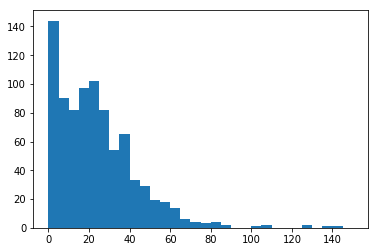

In [25]:
# Making list of bins = [0, 5, 10, 15, 20, ..., 145, 150]
a = []

for i in range(0, 151):
    if i%5 == 0:
        a.append(i)

plt.hist(n_censusblock, bins = a)

### Example: Census Block 250173532002010
<big>We'll take a look at census block 250173532002010, which has only one address assigned to it, to see why this might pose a high privacy risk.

In [26]:
(df[df['census_block_id_2010'] == '250173532002010'])

,address_id,building_id,cad_reporting_district,census_block_2010,census_block_group_2010,census_block_id_2010,census_tract_2010,election_polling_address,election_precinct,election_ward,...,police_neighborhood,police_sector,police_walking_route,representation_district,senate_district,stname,street_number,street_sweeping_district,type,zip_code
17591,11331,734-1,503,2010,2,250173532002010,353200,40 Granite St,3,5,...,5,3,5B,8th Suffolk,First Suffolk and Middlesex,Sidney St,240,None,BUILDING,02139


In [27]:
df.loc[17591]

address_id                                        11331
building_id                                       734-1
cad_reporting_district                              503
census_block_2010                                  2010
census_block_group_2010                               2
census_block_id_2010                    250173532002010
census_tract_2010                                353200
election_polling_address                  40 Granite St
election_precinct                                     3
election_ward                                         5
full_addr                                 240 Sidney St
latitude                                        42.3568
longitude                                       -71.106
maplot                                           66-152
neighborhood                              Cambridgeport
police_business_district                              5
police_car_route                                     5R
police_neighborhood                             

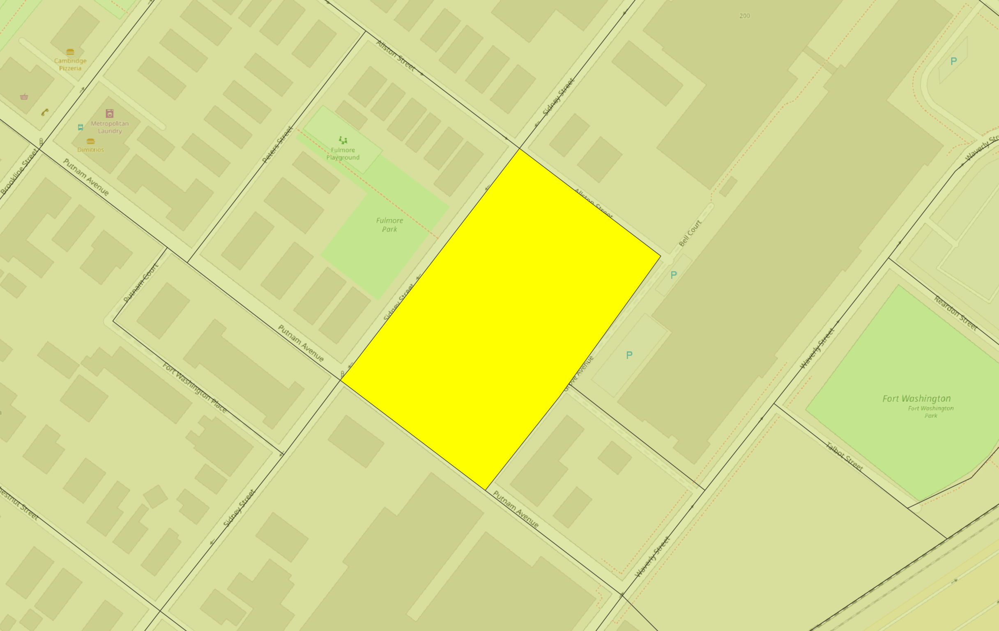

In [57]:
Image("C:\\Users\\sespinoza\\City of Cambridge Open Data\\censusblock2010.png")

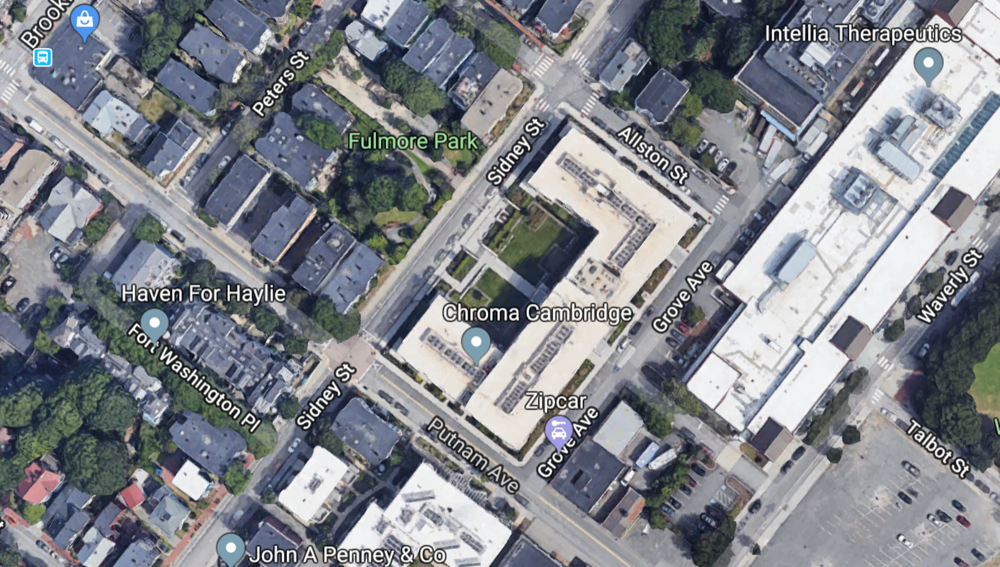

In [58]:
Image("C:\\Users\\sespinoza\\City of Cambridge Open Data\\census_2010_satellite.png")

<big> The census block encompasses only one apartment building which stands on the corner of Putnam Avenue and Sidney Street.

### Final Summary: Designating "High Risk" Census Blocks
<big> As with our analysis of the street names, we might want to assign a "high risk" census block to any block with five addresses or less. In total, there are <b>158</b> census blocks that would fit this category and <b>375</b> total addresses within these census blocks.

In [29]:
n_censusblock[n_censusblock <= 5]

census_block_id_2010
250173521011002    1
250173523002018    1
250173523002015    1
250173523002012    1
250173546001012    1
250173532001013    1
250173523001021    1
250173532002006    1
250173542002029    1
250173523001014    1
250173548002012    1
250173532002010    1
250173532002011    1
250173532003005    1
250173549003001    1
250173549003014    1
250173541004005    1
250173523001012    1
250173524001005    1
250173531023000    1
250173531022016    1
250173543002004    1
250173530004001    1
250173530004013    1
250173531011004    1
250173531011005    1
250173531011006    1
250173531011012    1
250173531011013    1
250173531011014    1
                  ..
250173530004005    4
250173532001006    4
250173531012004    4
250173539003008    4
250173531012022    4
250173531011010    4
250173537004006    4
250173549003030    4
250173532001014    4
250173548001001    4
250173537005001    4
250173530001000    4
250173537005002    4
250173531022013    4
250173532001015    4
2501735420010

In [30]:
n_censusblock[n_censusblock <= 5].sum()

375

<big> The table below shows how many census blocks have only one, two, three, four, or five addresses. For example, the table shows that there are <b>57</b> individual census blocks with only <b>one address</b>.

In [31]:
pd.DataFrame(n_censusblock.groupby(n_censusblock).count()).head()

,address_id
address_id,
1,57
2,35
3,30
4,22
5,14


<big> The table below shows the addresses that reside in any of the census blocks where the total number of addresses in that block are less than or equal to 5. </big>

In [44]:
df.loc[df['census_block_id_2010'].isin(list(n_censusblock[n_censusblock <= 5].index))]

,address_id,building_id,cad_reporting_district,census_block_2010,census_block_group_2010,census_block_id_2010,census_tract_2010,election_polling_address,election_precinct,election_ward,...,police_neighborhood,police_sector,police_walking_route,representation_district,senate_district,stname,street_number,street_sweeping_district,type,zip_code
7,31341,707-6,502,1013,1,250173532001013,353200,40 Granite St,3,5,...,5,3,5A,8th Suffolk,First Suffolk and Middlesex,Sidney St,167,C,BUILDING,02139
29,681,666-9,407,2000,2,250173531012000,353101,402 MASSACHUSETTS AVE,3,3,...,4,2,4A,26th Middlesex,Middlesex and Suffolk,Albany St,68,B,BUILDING,02142
213,13710,610-4,401,2026,2,250173524002026,352400,131 Washington St,1,2,...,4,2,,26th Middlesex,Middlesex and Suffolk,Technology Sq,700,B,BUILDING,02142
321,15624,424-2,708,3001,3,250173539003001,353900,58 Plympton St,3,8,...,7,4,H15,25th Middlesex,Middlesex and Suffolk,Bow St,44,E,BUILDING,02138
411,8012,126-6,912,3003,3,250173546003003,354600,66 Sherman St,3,10,...,9,5,9C,29th Middlesex,Second Middlesex,Concord Ave,445,J,BUILDING,02138
432,5406,677-1,202,2007,2,250173531022007,353102,70 Massachusetts Ave,3,2,...,2,1,,8th Suffolk,First Suffolk and Middlesex,Main St,238,B,BUILDING,02142
638,15301,269-19,902,3002,3,250173540003002,354000,28 Sacramento St,2,7,...,9,5,9A,25th Middlesex,Middlesex and Suffolk,Waterhouse St,1,H,BUILDING,02138
655,33039,None,101,1002,1,250173521011002,352101,48 Sixth St,1,1,...,1,1,,26th Middlesex,Middlesex and Suffolk,West Blvd,10,None,BUILDING,02141
694,6775,720-4,502,1014,1,250173532001014,353200,40 Granite St,3,5,...,5,3,5A,8th Suffolk,First Suffolk and Middlesex,Erie St,21,None,BUILDING,02139
787,29840,666-3,407,2000,2,250173531012000,353101,402 MASSACHUSETTS AVE,3,3,...,4,2,4A,26th Middlesex,Middlesex and Suffolk,Albany St,60,B,BUILDING,02142


# Part Three: Looking at Public Safety Reporting Areas
<big> From the dataframe, we see that there are only <b>115</b> public safety reporting areas.

In [33]:
df['cad_reporting_district'].nunique()

115

<big> The table below shows the number of addresses per reporting district. <b>Reporting District 608</b>, for example, has only one address, which upon inspection turns out to be the address for city hall. <b> Reporting District 1013</b> corresponds to the Cambridge Water Department, and <b> Reporting District 410 </b> corresponds to a small group of buildings near MIT on Main Street.

In [34]:
n_reportingareas = df.groupby('cad_reporting_district').nunique().sort_values('address_id')['address_id']
pd.DataFrame(n_reportingareas)

,address_id
cad_reporting_district,
608,1
1013,2
505,3
410,3
913,8
705,8
205,11
303,11
401,13


<big> The median number of addresses per reporting district is <b>129</b>. The distribution is similar to the kind we have seen before.

In [35]:
n_reportingareas.describe()

count    115.000000
mean     175.469565
std      157.662215
min        1.000000
25%       44.000000
50%      129.000000
75%      263.500000
max      841.000000
Name: address_id, dtype: float64

(array([17., 14., 14.,  2.,  9.,  6.,  6.,  2.,  5.,  6.,  7.,  4.,  4.,
         6.,  2.,  0.,  0.,  2.,  1.]),
 array([  0,  25,  50,  75, 100, 125, 150, 175, 200, 225, 250, 275, 300,
        325, 350, 375, 400, 425, 450, 475]),
 <a list of 19 Patch objects>)

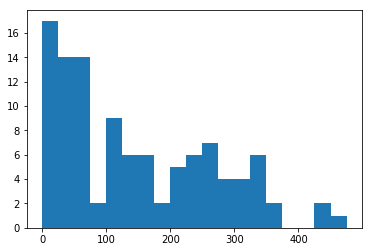

In [36]:
c = []

for i in range(0, 500):
    if i%25 == 0:
        c.append(i)

plt.hist(n_reportingareas, bins=c)

<i><big><b> The "median" reporting district: District 1002</i></b><br><big>
The median reporting district makes up the area directly west/southwest of Harvard Square, with 129 addresses encompassing this district.

In [37]:
df[df['cad_reporting_district']=='1002']

,address_id,building_id,cad_reporting_district,census_block_2010,census_block_group_2010,census_block_id_2010,census_tract_2010,election_polling_address,election_precinct,election_ward,...,police_neighborhood,police_sector,police_walking_route,representation_district,senate_district,stname,street_number,street_sweeping_district,type,zip_code
78,32911,380-3,1002,4008,4,250173541004008,354100,5 Longfellow Park,2,8,...,10,4,H16,25th Middlesex,Middlesex and Suffolk,Bennett St,4,K,BUILDING,02138
364,1484,380-3,1002,4008,4,250173541004008,354100,5 Longfellow Park,2,8,...,10,4,H16,25th Middlesex,Middlesex and Suffolk,Mt Auburn St,114,K,BUILDING,02138
523,17233,345-2,1002,3008,3,250173540003008,354000,5 Longfellow Park,2,8,...,10,4,H16,25th Middlesex,Middlesex and Suffolk,Massachusetts Ave,1426,K,BUILDING,02138
603,5256,376-1,1002,4010,4,250173541004010,354100,5 Longfellow Park,2,8,...,10,4,H16,25th Middlesex,Middlesex and Suffolk,JFK St,1,K,BUILDING,02138
678,32096,345-2,1002,3008,3,250173540003008,354000,5 Longfellow Park,2,8,...,10,4,H16,25th Middlesex,Middlesex and Suffolk,Massachusetts Ave,1420,K,BUILDING,02138
871,1209,345-7,1002,3008,3,250173540003008,354000,5 Longfellow Park,2,8,...,10,4,H16,25th Middlesex,Middlesex and Suffolk,Massachusetts Ave,1414,K,BUILDING,02138
950,314,345-12,1002,3009,3,250173540003009,354000,5 Longfellow Park,2,8,...,10,4,H16,25th Middlesex,Middlesex and Suffolk,Brattle St,25,K,BUILDING,02138
1197,11128,396-9,1002,4014,4,250173541004014,354100,5 Longfellow Park,2,8,...,10,4,H16,25th Middlesex,Middlesex and Suffolk,Winthrop St,96,K,BUILDING,02138
1377,1461,355-13,1002,4007,4,250173541004007,354100,5 Longfellow Park,2,8,...,10,4,H16,25th Middlesex,Middlesex and Suffolk,Mt Auburn St,115,K,BUILDING,02138
2352,17610,396-11,1002,4014,4,250173541004014,354100,5 Longfellow Park,2,8,...,10,4,H16,25th Middlesex,Middlesex and Suffolk,Eliot St,28,K,BUILDING,02138


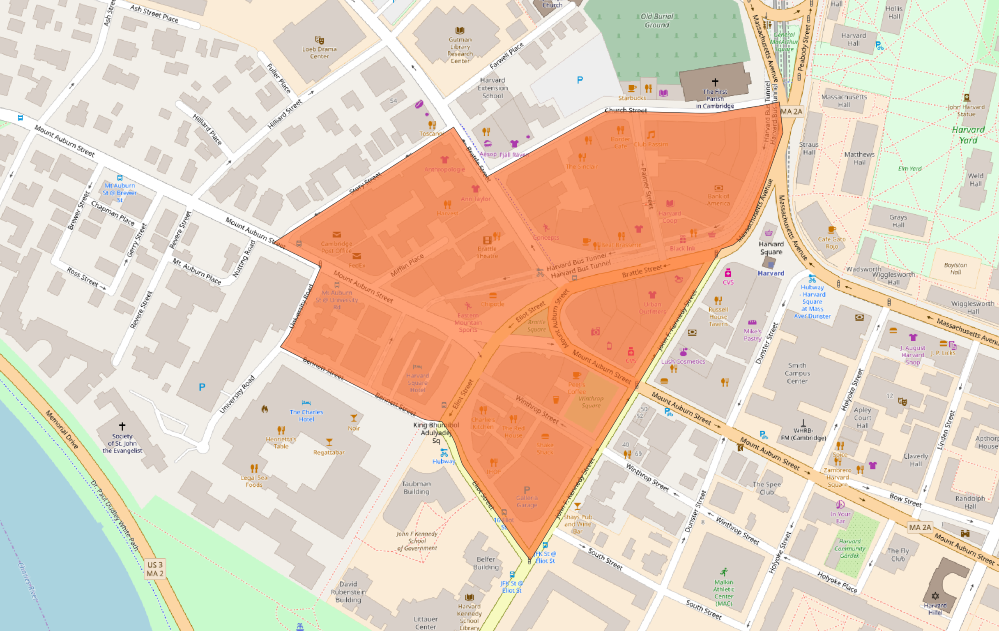

In [38]:
Image("C:\\Users\\sespinoza\\City of Cambridge Open Data\\district1002.png")

### Example: Reporting District 1304
<big> Reporting district 1304 seems to be a good example of a "high risk" district relative to the others. The district encompasses a number of public buildings sitting on the west side of Fresh Pond, though it also includes a small number of homes that sit directly along Grove and Huron streets.

In [39]:
df[df['cad_reporting_district'] == '1304']

,address_id,building_id,cad_reporting_district,census_block_2010,census_block_group_2010,census_block_id_2010,census_tract_2010,election_polling_address,election_precinct,election_ward,...,police_neighborhood,police_sector,police_walking_route,representation_district,senate_district,stname,street_number,street_sweeping_district,type,zip_code
156,2524,140-17,1304,3000,3,250173543003000,354300,450 Concord Ave,2,9,...,13,4,13B,29th Middlesex,Second Middlesex,Grove St,149,None,BUILDING,02138
1346,3647,140-12,1304,3000,3,250173543003000,354300,450 Concord Ave,2,9,...,13,4,13B,29th Middlesex,Second Middlesex,Grove St,181,None,BUILDING,02138
2791,4556,140-10,1304,3000,3,250173543003000,354300,450 Concord Ave,2,9,...,13,4,13B,29th Middlesex,Second Middlesex,Grove St,215,None,BUILDING,02138
4588,4975,140-6,1304,3000,3,250173543003000,354300,450 Concord Ave,2,9,...,13,4,13B,29th Middlesex,Second Middlesex,Grove St,231,None,BUILDING,02138
5243,3050,140-15,1304,3000,3,250173543003000,354300,450 Concord Ave,2,9,...,13,4,13B,29th Middlesex,Second Middlesex,Grove St,161,None,BUILDING,02138
5788,4816,140-7,1304,3000,3,250173543003000,354300,450 Concord Ave,2,9,...,13,4,13B,29th Middlesex,Second Middlesex,Grove St,225,None,BUILDING,02138
5952,5416,140-3,1304,3000,3,250173543003000,354300,450 Concord Ave,2,9,...,13,4,13B,29th Middlesex,Second Middlesex,Grove St,255,None,BUILDING,02138
6694,3457,140-13,1304,3000,3,250173543003000,354300,450 Concord Ave,2,9,...,13,4,13B,29th Middlesex,Second Middlesex,Grove St,175,None,BUILDING,02138
8278,5630,140-1,1304,3000,3,250173543003000,354300,450 Concord Ave,2,9,...,13,4,13B,29th Middlesex,Second Middlesex,Grove St,267,None,BUILDING,02138
9455,5181,140-5,1304,3000,3,250173543003000,354300,450 Concord Ave,2,9,...,13,4,13B,29th Middlesex,Second Middlesex,Grove St,241,None,BUILDING,02138


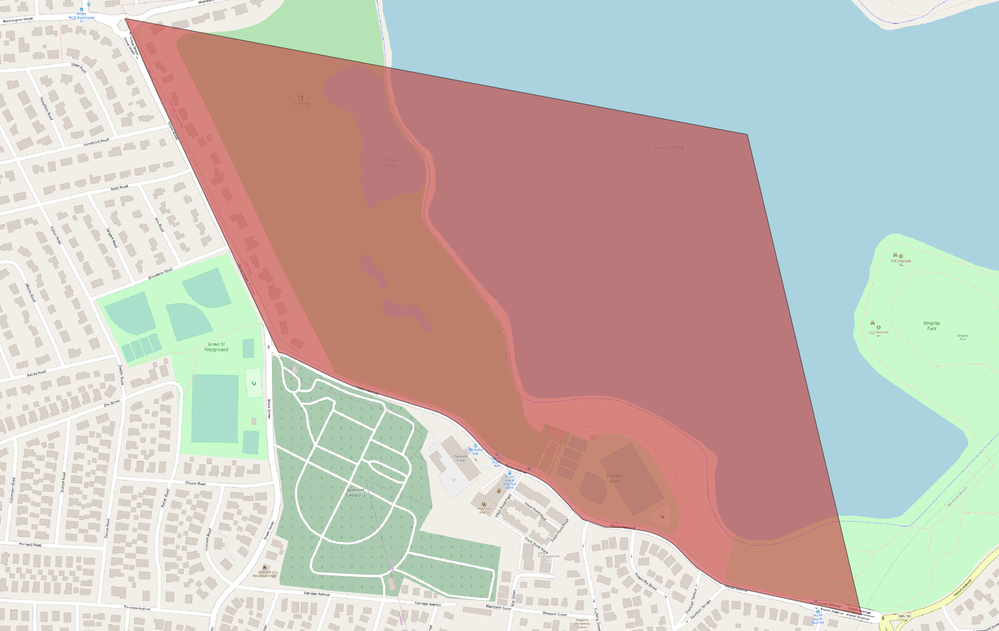

In [40]:
Image("C:\\Users\\sespinoza\\City of Cambridge Open Data\\district1304.png")

<big> Nonetheless, the 20 addresses that are in this district are arguably enough to maintain a level of privacy that is secure.

## Summary: Riskiest Districts
<big> Though it seems like there is relatively little risk in even the districts with the smallest addresses, caution should be exercised with districts that have around 25 or less addresses. This makes up only <b>18</b> districts.

In [41]:
pd.DataFrame(n_reportingareas[n_reportingareas <=25])

,address_id
cad_reporting_district,
608,1
1013,2
505,3
410,3
913,8
705,8
205,11
303,11
401,13


<big>A list of addresses located within these districts is shown below. In total there are <b> 237 addresses within these districts.

In [42]:
df.loc[df['cad_reporting_district'].isin(list(n_reportingareas[n_reportingareas <= 25].index))]

,address_id,building_id,cad_reporting_district,census_block_2010,census_block_group_2010,census_block_id_2010,census_tract_2010,election_polling_address,election_precinct,election_ward,...,police_neighborhood,police_sector,police_walking_route,representation_district,senate_district,stname,street_number,street_sweeping_district,type,zip_code
1,15340,348-9,1017,2008,2,250173541002008,354100,5 Longfellow Park,2,8,...,10,4,NaN,25th Middlesex,Middlesex and Suffolk,Memorial Dr,993,K,BUILDING,02138
29,681,666-9,407,2000,2,250173531012000,353101,402 MASSACHUSETTS AVE,3,3,...,4,2,4A,26th Middlesex,Middlesex and Suffolk,Albany St,68,B,BUILDING,02142
156,2524,140-17,1304,3000,3,250173543003000,354300,450 Concord Ave,2,9,...,13,4,13B,29th Middlesex,Second Middlesex,Grove St,149,None,BUILDING,02138
213,13710,610-4,401,2026,2,250173524002026,352400,131 Washington St,1,2,...,4,2,,26th Middlesex,Middlesex and Suffolk,Technology Sq,700,B,BUILDING,02142
332,31973,571-1,102,1021,1,250173521021021,352102,48 Sixth St,1,1,...,1,1,,26th Middlesex,Middlesex and Suffolk,First St,122,None,BUILDING,02141
572,30920,387-2,1016,2024,2,250173542002024,354200,167 Lexington Ave,1,9,...,10,4,,29th Middlesex,Second Middlesex,Coolidge Hill,170-A,K,BUILDING,02138
608,31192,557-5,303,1000,1,250173524001000,352400,25 Eighth St,2,1,...,3,1,3B,26th Middlesex,Middlesex and Suffolk,One Kendall Square Complex,1000,A,BUILDING,02142
631,6084,348-3,1017,2008,2,250173541002008,354100,5 Longfellow Park,2,8,...,10,4,NaN,25th Middlesex,Middlesex and Suffolk,Ash St,29,K,BUILDING,02138
757,2031,604-1,705,1003,1,250173535001003,353500,795 Massachusetts Ave,2,4,...,7,3,7A,25th Middlesex,Middlesex and Suffolk,Pleasant St,12,E,BUILDING,02139
787,29840,666-3,407,2000,2,250173531012000,353101,402 MASSACHUSETTS AVE,3,3,...,4,2,4A,26th Middlesex,Middlesex and Suffolk,Albany St,60,B,BUILDING,02142


<i><b> Saving lists of "riskiest" streets, census blocks, and reporting districts as Excel files

In [54]:
writer = pd.ExcelWriter('C:\\Users\\sespinoza\\City of Cambridge Open Data\\riskanalysis.xlsx')

a = df.loc[df['stname'].isin(list(street_count[street_count<=5].index))]

b = df.loc[df['census_block_id_2010'].isin(list(n_censusblock[n_censusblock <= 5].index))]

c = df.loc[df['cad_reporting_district'].isin(list(n_reportingareas[n_reportingareas <= 25].index))]

a.to_excel(writer, 'Sheet1')
b.to_excel(writer, 'Sheet2')
c.to_excel(writer, 'Sheet3')